In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import os

In [27]:
import torch
import torch.nn as nn

In [8]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

# Encoding Functions:

In [2]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Concatenate

## ResNet Feature Extractor:

In [17]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess_input

In [18]:
def extract_resnet_features(img_path):
    # Load ResNet50 model, without the classification layer
    model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

    # Load and preprocess image
    img = image.load_img(img_path, target_size=(224, 224))  # Resize image to 224x224
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = resnet_preprocess_input(img_array)

    # Extract features
    features = model.predict(img_array)
    return features  # 2048-dimensional vector

## VGG16 Feature Extractor:

In [19]:
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg_preprocess_input

In [22]:
def extract_vgg16_features(img_path):
    # Load VGG16 model, without the classification layer (GlobalAveragePooling already applied)
    model = VGG16(weights='imagenet', include_top=False, pooling='avg')

    # Load and preprocess image
    img = image.load_img(img_path, target_size=(224, 224))  # Resize image to 224x224
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = vgg_preprocess_input(img_array)

    # Extract features
    features = model.predict(img_array)
    return features

## Encoding Sample Image:

In [26]:
img_path = '/content/fruit_tree.jpg'

resnet_features = extract_resnet_features(img_path)
print("ResNet50 Features:", resnet_features.shape)

vgg16_features = extract_vgg16_features(img_path)
print("VGG16 Features:", vgg16_features.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
ResNet50 Features: (1, 2048)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
VGG16 Features: (1, 512)


# Encoding Caltech256

In [28]:
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader

In [35]:
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize for ResNet50 and VGG16 input
    transforms.Lambda(lambda img: img.convert('RGB') if img.mode != 'RGB' else img),  # Convert grayscale to RGB
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [36]:
data_dir = './caltech256'
if not os.path.exists(data_dir):
    os.makedirs(data_dir)
caltech256 = datasets.Caltech256(root=data_dir, download=True, transform=preprocess)
dataloader = DataLoader(caltech256, batch_size=32, shuffle=False)

Files already downloaded and verified


In [37]:
resnet_model = models.resnet50(pretrained=True)
resnet_model = nn.Sequential(*list(resnet_model.children())[:-1])  # Remove the classification layer
resnet_model = resnet_model.to(device)
resnet_model.eval()

vgg16_model = models.vgg16(pretrained=True)
vgg16_model = nn.Sequential(*list(vgg16_model.children())[:-1])  # Remove the classification layer
vgg16_model = vgg16_model.to(device)
vgg16_model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
 

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [41]:
def encode_images_resnet(dataloader, device):

    temp = 0
    all_features = []
    all_labels = []

    for images, labels in dataloader:

        temp += 1
        if (temp%50 == 0):
            print(temp)

        images = images.to(device)

        with torch.no_grad():
            features = resnet_model(images)
            features = features.view(features.size(0), -1)  # Flatten features

        all_features.append(features.cpu())
        all_labels.append(labels)

    all_features = torch.cat(all_features)
    all_labels = torch.cat(all_labels)

    return all_features, all_labels

In [46]:
global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))

def encode_images_vgg(dataloader, device):
    all_features = []
    all_labels = []

    for images, labels in dataloader:
        images = images.to(device)

        with torch.no_grad():
            features = vgg16_model(images)
            features = global_avg_pool(features)  # Apply global average pooling
            features = features.view(features.size(0), -1)  # Flatten to (batch_size, 512)

        all_features.append(features.cpu())
        all_labels.append(labels)

    all_features = torch.cat(all_features)
    all_labels = torch.cat(all_labels)

    return all_features, all_labels

In [47]:
start_time = time.time()
resnet_features, labels = encode_images_resnet(dataloader, device)
vgg16_features, _ = encode_images_vgg(dataloader, device)
end_time = time.time()

50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950


In [49]:
print("Time Taken:", end_time - start_time, "seconds")
print(f"ResNet50 Features: {resnet_features.shape}")
print(f"VGG16 Features: {vgg16_features.shape}")

Time Taken: 478.86182594299316 seconds
ResNet50 Features: torch.Size([30607, 2048])
VGG16 Features: torch.Size([30607, 512])


In [50]:
encoded_features = torch.cat((resnet_features, vgg16_features), dim=1)
print(f"Combined Features: {encoded_features.shape}")

Combined Features: torch.Size([30607, 2560])


In [51]:
encoded_features_np = encoded_features.cpu().numpy()
df_encoded_features = pd.DataFrame(encoded_features_np)
df_encoded_features.to_csv('encoded_features_resnetvgg16.csv', index=False)

## Sample Image and its Vector Representation:

Label: 0
Feature Vector Representation (ResNet + VGG): [0.58949214 0.41618657 0.7344597  ... 0.         0.94593513 0.12498112]


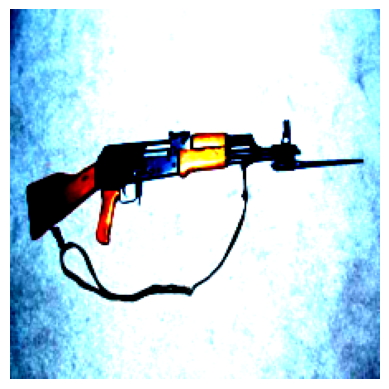

In [53]:
image, label = caltech256[0]
image = image.permute(1, 2, 0)

image_np = image.numpy()
print(f"Label: {label}")
print(f"Feature Vector Representation (ResNet + VGG): {encoded_features[0].numpy()}")

plt.imshow(image_np)
plt.axis('off')
plt.show()

# Content Based Image Retrieval:

The researchers have used Euclidean Distance for similarity measurement

## Retrieve top k similar images based on Euclidean Distance:

In [54]:
from sklearn.metrics.pairwise import euclidean_distances

In [55]:
def retrieve_similar_images(query_index, encoded_features, dataloader, labels, k=10):
    """
    Retrieve and print the top-k similar images based on Euclidean distance, along with their labels.
    Returns a score indicating how many retrieved images share the same label as the query image.

    Args:
    - query_index (int): Index of the query image in the dataset.
    - encoded_features (torch.Tensor): Encoded features of all images in the dataset.
    - dataloader (torch.utils.data.DataLoader): Dataloader containing the dataset images.
    - labels (list): List of labels corresponding to the dataset images.
    - k (int): Number of similar images to retrieve (default is 10).

    Returns:
    - score (int): Number of retrieved images with the same label as the query image.
    """

    # Access the dataset from the dataloader
    dataset = dataloader.dataset

    # Convert encoded features to numpy if it's a tensor
    encoded_features_np = encoded_features.cpu().numpy() if isinstance(encoded_features, torch.Tensor) else encoded_features

    # Step 1: Extract the query image feature vector
    query_feature = encoded_features_np[query_index].reshape(1, -1)

    # Step 2: Compute Euclidean distances between the query feature and all other features
    distances = euclidean_distances(query_feature, encoded_features_np).flatten()

    # Step 3: Get the indices of the top-k closest images (excluding the query image itself)
    top_k_indices = distances.argsort()[:k + 1]  # Sort distances and get top k+1 (including the query image)

    # Step 4: Display the query image and the top-k similar images
    query_image, _ = dataset[query_index]  # Extract the query image from the dataset

    # Initialize score counter
    score = 0

    # Plot the query image
    plt.figure(figsize=(15, 5))
    plt.subplot(1, k + 1, 1)
    plt.imshow(query_image.permute(1, 2, 0))  # Change dimensions to HxWxC for plotting
    plt.title(f'Query Image\nLabel: {labels[query_index]}')
    plt.axis('off')

    for i, idx in enumerate(top_k_indices[1:k + 1]):  # Skip the first one as it is the query image itself
        similar_image, _ = dataset[idx]  # Get the similar image
        plt.subplot(1, k + 1, i + 2)
        plt.imshow(similar_image.permute(1, 2, 0))  # Change dimensions to HxWxC for plotting
        plt.title(f"Rank {i + 1}\nLabel: {labels[idx]}")
        plt.axis('off')

        # Check if the label matches the query label
        if labels[idx] == labels[query_index]:
            score += 1
    plt.show()

    return score

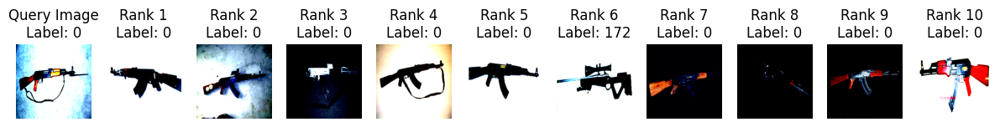

9

In [56]:
retrieve_similar_images(query_index=0, encoded_features=encoded_features, dataloader=dataloader, labels=labels, k=10)

## CBIR Model Evaluation:

In [58]:
random_indices = np.random.choice(len(encoded_features), 100, replace=False)
len(random_indices)

100

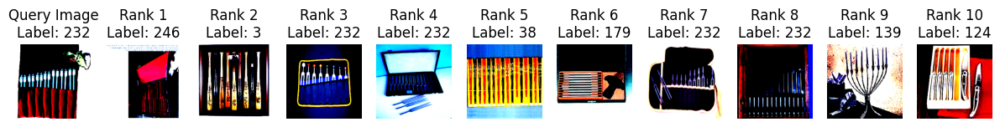

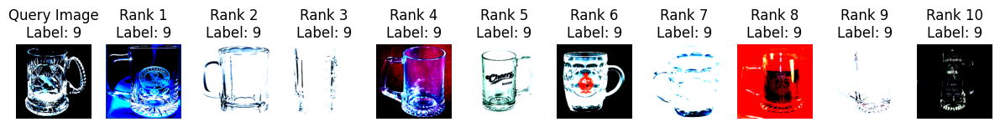

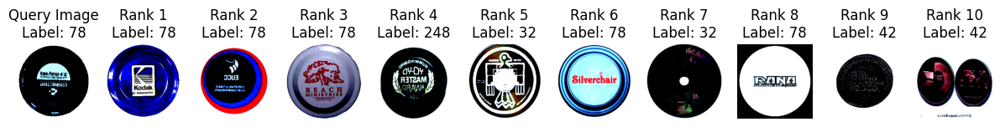

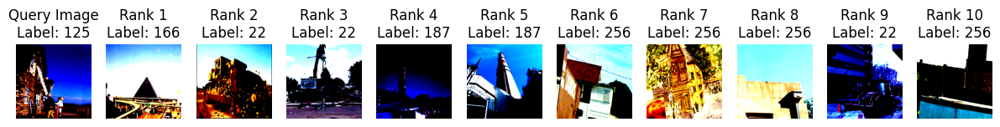

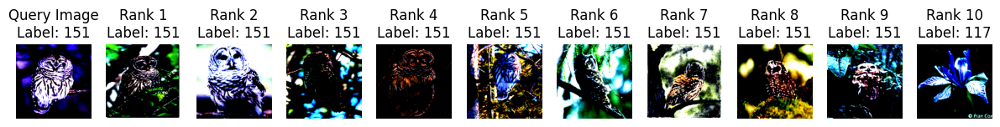

...

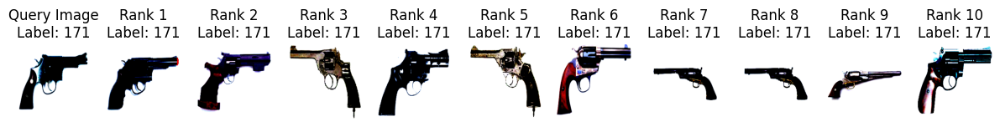

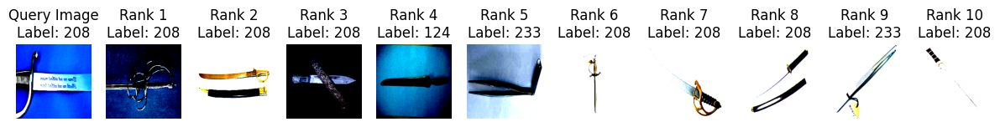

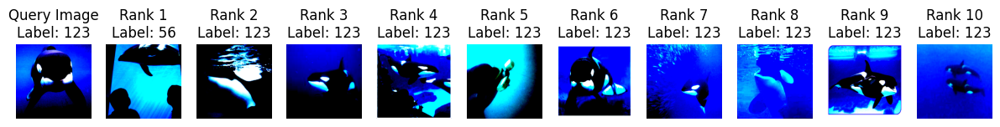

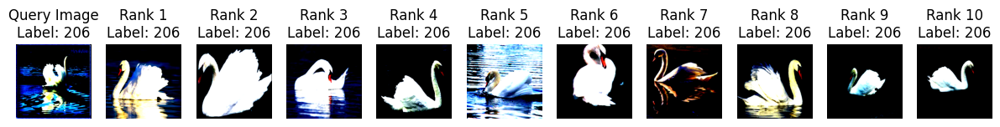

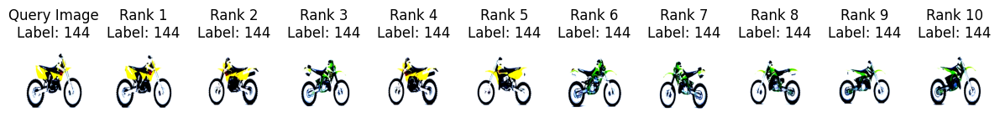

Accuracies for each query image: [ 4 10  5  0  9  9  4 10  6 10  4  2  8 10 10 10 10 10 10 10  0  7  9 10
  2 10  2  2 10  1  1  9 10  0  5  4  7 10 10 10  6 10  5  8  9  8  5  9
  7  9 10  8  7  8 10  3  1 10 10  8  0 10  1 10  9 10 10 10 10  5 10  7
  0  6  1  7  7  8 10 10  2  5 10  0  1 10 10 10  2  8 10  5  0  1  7 10
  7  9 10 10]


In [59]:
accuracies = []
for index in random_indices:
    score = retrieve_similar_images(query_index=index, encoded_features=encoded_features, dataloader=dataloader, labels=labels, k=10)
    accuracies.append(score)
accuracies_array = np.array(accuracies)
print("Accuracies for each query image:", accuracies_array)

In [60]:
np.mean(accuracies_array)

6.89